In [1]:
from flu_matrix_completion import *

<Axes: ylabel='sampleID'>

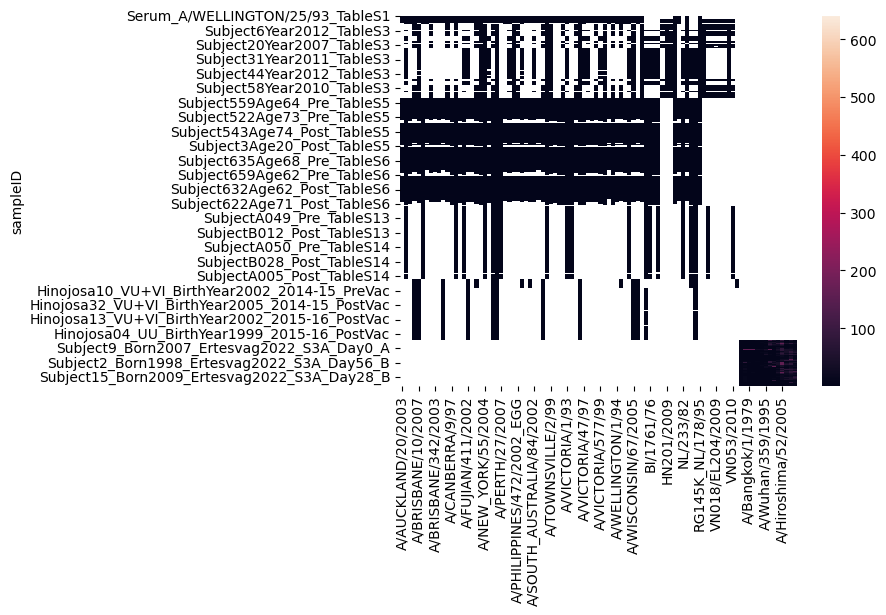

In [11]:
# Load in antisera-virus data as pd.DataFrames
all_HI_df = pd.read_csv("data/all_data.csv", index_col='sampleID')
all_antisera_df = pd.read_csv("data/all_data_antisera_table.csv", index_col='sampleID')
all_HI_data_tables  = HI_data_tables() # Create HI_data_tables object
all_HI_data_tables.add_HI_data(HI_df=all_HI_df,
                               antisera_df=all_antisera_df) # Add data from Tal's ad Rong's original paper
all_HI_data_tables.compute_virus_dates()
sns.heatmap(all_HI_data_tables.HI_data)

In [7]:
np.random.seed(10)
train_trees=50
best_trees=10
n_features=10
f_sample = 0.7
all_comparisons_obj = transferability_comparisons(HI_data_tables=all_HI_data_tables)
model_name = f'all_w_ODRs_traintrees{train_trees}_besttrees{best_trees}_regular_features{n_features}'
all_comparisons_obj.train_comparison_trees(train_trees=train_trees, best_trees=best_trees, n_features=n_features, f_sample=f_sample)
all_comparisons_obj.compute_comparison_virus_ODR_df_dict()
all_comparisons_obj.plot_comparisons_with_ODRs(save_to=f'figs/{model_name}.png', figsize=(200,200), s=200,  alpha=0.5)
all_comparisons_obj.save_data(save_to=f"models/{model_name}.pkl")